In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy

from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline
!pip install scrapy

In [3]:
reviews=pd.read_csv('extract_reviews.csv',encoding='Latin-1')
reviews


,stars,comment
0,5.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n \n \n \n Writing th...
1,4.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n \n \n \n Very effec...
2,5.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n \n \n \n 1. Nice Pa...
3,5.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n \n \n \n Bought thi...
4,5.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n \n \n \n I bought t...
...,...,...
2396,1.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n \n \n \n My first o...
2397,1.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n \n \n \n THIS IS ON...
2398,5.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n \n \n \n A One plus...
2399,4.0 out of 5 stars,\n\n\n\n\n\n\n\n\n\n \n \n \n No earphon...


In [131]:
sample_list =reviews
converted_list = []

for element in sample_list:
    converted_list.append(element.strip())

print(converted_list)


['stars', 'comment']


In [4]:
reviews['comment']

0       \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Writing th...
1       \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Very effec...
2       \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  1. Nice Pa...
3       \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Bought thi...
4       \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  I bought t...
                              ...                        
2396    \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  My first o...
2397    \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  THIS IS ON...
2398    \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  A One plus...
2399    \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  No earphon...
2400    \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  You can al...
Name: comment, Length: 2401, dtype: object

In [6]:
reviews=[str(comment) for comment in reviews.comment] # remove both the leading and the trailing characters
reviews=[comment for comment in reviews if comment] # removes empty strings, because they are considered in Python as False
reviews[0:10]

["\n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Writing this review after 3 months of usage. Very rugged, well build and strong board books. My 9 moth old son (back then) llhad literally abused them to greater lengths but they still are intact. Minor bends here and there which are not uncommon. My son has chewed, poured water, stood on them, Tried to press against the Binding and what not. They still are running strong. The books seem water resistant if not water proof. Coming to the content, they are clear and vibrant. My son has learnt a lot in the last six months. One tip is to read the books to your kids atleast 15 to 20 min every day. They will develop the back of glancing or reading these board books. Can't be more happy. One of the best purchases\n\n  \n",
 '\n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Very effective picture book for upto 3 year babies.\n\n  \n',
 "\n\n\n\n\n\n\n\n\n\n  \n  \n    \n  1. Nice Packaging & Timely delivery.2. The content & presentation is good, kids would love going t

In [7]:
reviews_text=' '.join(reviews)
reviews_text

'\n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Writing this review after 3 months of usage. Very rugged, well build and strong board books. My 9 moth old son (back then) llhad literally abused them to greater lengths but they still are intact. Minor bends here and there which are not uncommon. My son has chewed, poured water, stood on them, Tried to press against the Binding and what not. They still are running strong. The books seem water resistant if not water proof. Coming to the content, they are clear and vibrant. My son has learnt a lot in the last six months. One tip is to read the books to your kids atleast 15 to 20 min every day. They will develop the back of glancing or reading these board books. Can\'t be more happy. One of the best purchases\n\n  \n \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Very effective picture book for upto 3 year babies.\n\n  \n \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  1. Nice Packaging & Timely delivery.2. The content & presentation is good, kids would love going through t

In [8]:
no_punc_text=reviews_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'\n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Writing this review after 3 months of usage Very rugged well build and strong board books My 9 moth old son back then llhad literally abused them to greater lengths but they still are intact Minor bends here and there which are not uncommon My son has chewed poured water stood on them Tried to press against the Binding and what not They still are running strong The books seem water resistant if not water proof Coming to the content they are clear and vibrant My son has learnt a lot in the last six months One tip is to read the books to your kids atleast 15 to 20 min every day They will develop the back of glancing or reading these board books Cant be more happy One of the best purchases\n\n  \n \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Very effective picture book for upto 3 year babies\n\n  \n \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  1 Nice Packaging  Timely delivery2 The content  presentation is good kids would love going through the books It will surely aid 

In [9]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Shabarish\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Shabarish\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [10]:
from nltk import word_tokenize
text_tokens=word_tokenize(no_punc_text)
print(text_tokens[0:50])

['Writing', 'this', 'review', 'after', '3', 'months', 'of', 'usage', 'Very', 'rugged', 'well', 'build', 'and', 'strong', 'board', 'books', 'My', '9', 'moth', 'old', 'son', 'back', 'then', 'llhad', 'literally', 'abused', 'them', 'to', 'greater', 'lengths', 'but', 'they', 'still', 'are', 'intact', 'Minor', 'bends', 'here', 'and', 'there', 'which', 'are', 'not', 'uncommon', 'My', 'son', 'has', 'chewed', 'poured', 'water']


In [11]:
len(text_tokens)

230804

In [12]:
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list=['I','The','It','A']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['Writing', 'review', '3', 'months', 'usage', 'Very', 'rugged', 'well', 'build', 'strong', 'board', 'books', 'My', '9', 'moth', 'old', 'son', 'back', 'llhad', 'literally', 'abused', 'greater', 'lengths', 'still', 'intact', 'Minor', 'bends', 'uncommon', 'My', 'son', 'chewed', 'poured', 'water', 'stood', 'Tried', 'press', 'Binding', 'They', 'still', 'running', 'strong', 'books', 'seem', 'water', 'resistant', 'water', 'proof', 'Coming', 'content', 'clear', 'vibrant', 'My', 'son', 'learnt', 'lot', 'last', 'six', 'months', 'One', 'tip', 'read', 'books', 'kids', 'atleast', '15', '20', 'min', 'every', 'day', 'They', 'develop', 'back', 'glancing', 'reading', 'board', 'books', 'Cant', 'happy', 'One', 'best', 'purchases', 'Very', 'effective', 'picture', 'book', 'upto', '3', 'year', 'babies', '1', 'Nice', 'Packaging', 'Timely', 'delivery2', 'content', 'presentation', 'good', 'kids', 'would', 'love', 'going', 'books', 'surely', 'aid', 'learning', 'process3', 'books', 'robust', 'withstand', 'rough'

In [13]:
lower_words=[comment.lower() for comment in no_stop_tokens]
print(lower_words)

['writing', 'review', '3', 'months', 'usage', 'very', 'rugged', 'well', 'build', 'strong', 'board', 'books', 'my', '9', 'moth', 'old', 'son', 'back', 'llhad', 'literally', 'abused', 'greater', 'lengths', 'still', 'intact', 'minor', 'bends', 'uncommon', 'my', 'son', 'chewed', 'poured', 'water', 'stood', 'tried', 'press', 'binding', 'they', 'still', 'running', 'strong', 'books', 'seem', 'water', 'resistant', 'water', 'proof', 'coming', 'content', 'clear', 'vibrant', 'my', 'son', 'learnt', 'lot', 'last', 'six', 'months', 'one', 'tip', 'read', 'books', 'kids', 'atleast', '15', '20', 'min', 'every', 'day', 'they', 'develop', 'back', 'glancing', 'reading', 'board', 'books', 'cant', 'happy', 'one', 'best', 'purchases', 'very', 'effective', 'picture', 'book', 'upto', '3', 'year', 'babies', '1', 'nice', 'packaging', 'timely', 'delivery2', 'content', 'presentation', 'good', 'kids', 'would', 'love', 'going', 'books', 'surely', 'aid', 'learning', 'process3', 'books', 'robust', 'withstand', 'rough'

In [14]:
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens)

['write', 'review', '3', 'month', 'usag', 'veri', 'rug', 'well', 'build', 'strong', 'board', 'book', 'my', '9', 'moth', 'old', 'son', 'back', 'llhad', 'liter', 'abus', 'greater', 'length', 'still', 'intact', 'minor', 'bend', 'uncommon', 'my', 'son', 'chew', 'pour', 'water', 'stood', 'tri', 'press', 'bind', 'they', 'still', 'run', 'strong', 'book', 'seem', 'water', 'resist', 'water', 'proof', 'come', 'content', 'clear', 'vibrant', 'my', 'son', 'learnt', 'lot', 'last', 'six', 'month', 'one', 'tip', 'read', 'book', 'kid', 'atleast', '15', '20', 'min', 'everi', 'day', 'they', 'develop', 'back', 'glanc', 'read', 'board', 'book', 'cant', 'happi', 'one', 'best', 'purchas', 'veri', 'effect', 'pictur', 'book', 'upto', '3', 'year', 'babi', '1', 'nice', 'packag', 'time', 'delivery2', 'content', 'present', 'good', 'kid', 'would', 'love', 'go', 'book', 'sure', 'aid', 'learn', 'process3', 'book', 'robust', 'withstand', 'rough', 'handl', 'lil', 'champs4', 'just', 'size', 'book', 'may', 'disapppint', 

In [15]:
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

writing review 3 months usage very rugged well build strong board books my 9 moth old son back llhad literally abused greater lengths still intact minor bends uncommon my son chewed poured water stood tried press binding they still running strong books seem water resistant water proof coming content clear vibrant my son learnt lot last six months one tip read books kids atleast 15 20 min every day they develop back glancing reading board books cant happy one best purchases very effective picture book upto 3 year babies 1 nice packaging timely delivery2 content presentation good kids would love going books surely aid learning process3 books robust withstand rough handling lil champs4 just size books may disapppint but overall value money bought 15 year old boy he loves books we read everyday doesnt get bored looking books especially transport book hes already learning recognizing many new things this healthy distraction cartoonsmobiletvpros board books tear bend easily rounded edges hur

In [16]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['write', 'review', '3', 'month', 'usage', 'very', 'rugged', 'well', 'build', 'strong', 'board', 'book', 'my', '9', 'moth', 'old', 'son', 'back', 'llhad', 'literally', 'abuse', 'great', 'length', 'still', 'intact', 'minor', 'bend', 'uncommon', 'my', 'son', 'chew', 'pour', 'water', 'stand', 'try', 'press', 'binding', 'they', 'still', 'run', 'strong', 'book', 'seem', 'water', 'resistant', 'water', 'proof', 'come', 'content', 'clear', 'vibrant', 'my', 'son', 'learnt', 'lot', 'last', 'six', 'month', 'one', 'tip', 'read', 'book', 'kid', 'atleast', '15', '20', 'min', 'every', 'day', 'they', 'develop', 'back', 'glance', 'reading', 'board', 'book', 'can', 'not', 'happy', 'one', 'good', 'purchase', 'very', 'effective', 'picture', 'book', 'upto', '3', 'year', 'baby', '1', 'nice', 'packaging', 'timely', 'delivery2', 'content', 'presentation', 'good', 'kid', 'would', 'love', 'go', 'book', 'surely', 'aid', 'learn', 'process3', 'book', 'robust', 'withstand', 'rough', 'handling', 'lil', 'champs4', 'j

In [17]:
clean_reviews=' '.join(lemmas)
clean_reviews

'write review 3 month usage very rugged well build strong board book my 9 moth old son back llhad literally abuse great length still intact minor bend uncommon my son chew pour water stand try press binding they still run strong book seem water resistant water proof come content clear vibrant my son learnt lot last six month one tip read book kid atleast 15 20 min every day they develop back glance reading board book can not happy one good purchase very effective picture book upto 3 year baby 1 nice packaging timely delivery2 content presentation good kid would love go book surely aid learn process3 book robust withstand rough handling lil champs4 just size book may disapppint but overall value money buy 15 year old boy he love book we read everyday do not get bored look book especially transport book he s already learn recognize many new thing this healthy distraction cartoonsmobiletvpros board book tear bend easily round edge hurt child colourful clear image every page 10 topic lot l

In [18]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
reviewscv=cv.fit_transform(lemmas)

In [19]:
print(cv.vocabulary_)

{'write': 2639, 'review': 2054, 'month': 1585, 'usage': 2499, 'very': 2531, 'rugged': 2072, 'well': 2578, 'build': 479, 'strong': 2277, 'board': 394, 'book': 398, 'my': 1612, 'moth': 1593, 'old': 1700, 'son': 2229, 'back': 315, 'llhad': 1480, 'literally': 1473, 'abuse': 143, 'great': 1108, 'length': 1446, 'still': 2269, 'intact': 1296, 'minor': 1557, 'bend': 357, 'uncommon': 2476, 'chew': 550, 'pour': 1863, 'water': 2563, 'stand': 2257, 'try': 2460, 'press': 1877, 'binding': 373, 'they': 2365, 'run': 2073, 'seem': 2105, 'resistant': 2047, 'proof': 1918, 'come': 610, 'content': 652, 'clear': 574, 'vibrant': 2533, 'learnt': 1441, 'lot': 1492, 'last': 1418, 'six': 2164, 'one': 1706, 'tip': 2413, 'read': 1983, 'kid': 1366, 'atleast': 269, '15': 14, '20': 34, 'min': 1553, 'every': 895, 'day': 714, 'develop': 761, 'glance': 1054, 'reading': 1985, 'can': 501, 'not': 1658, 'happy': 1155, 'good': 1063, 'purchase': 1936, 'effective': 848, 'picture': 1816, 'upto': 2493, 'year': 2645, 'baby': 308,

In [20]:
print(cv.get_feature_names()[150:300])

['active', 'activity', 'activityquality', 'actual', 'actually', 'ad', 'adapter', 'adaptor', 'add', 'addict', 'ade', 'adhesive', 'adult', 'adultthe', 'advance', 'advantage', 'advisable', 'aeroplane', 'affect', 'afford', 'affordable', 'afraid', 'after', 'ag', 'again', 'age', 'agea', 'agian', 'agowhen', 'ahead', 'aheaditz', 'aheadð', 'aid', 'airplane', 'al', 'alfabet', 'all', 'allclear', 'allhe', 'allow', 'allworth', 'almost', 'alone', 'along', 'alot', 'alphabet', 'alphabetsthe', 'already', 'also', 'alternative', 'although', 'always', 'amaze', 'amazed', 'amazing', 'amazingi', 'amazingly', 'amazon', 'amazone', 'ambiance', 'american', 'amlost', 'amoeld', 'amole', 'amount', 'and', 'android', 'androidcamara', 'animal', 'animalsbird', 'animalsfruitsvegetable', 'animate', 'anither', 'another', 'ant', 'antutu', 'any', 'anymore', 'anyone', 'anything', 'anyway', 'anyways', 'anywhere', 'apart', 'apartwhen', 'aperture', 'app', 'appeal', 'appear', 'appearance', 'appel', 'apple', 'apply', 'appreciate'

In [21]:
print(reviewscv.toarray()[150:300])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [22]:
print(reviewscv.toarray().shape)

(153980, 2677)


In [23]:
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram_range.fit_transform(lemmas)

In [24]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['35', '90', 'also', 'always', 'amazing', 'and', 'as', 'average', 'battery', 'be', 'book', 'but', 'buy', 'call', 'camera', 'can', 'cast', 'channel', 'charge', 'charger', 'clear', 'color', 'come', 'curator', 'day', 'design', 'device', 'display', 'do', 'earphone', 'even', 'experience', 'fast', 'feel', 'fluid', 'full', 'get', 'give', 'go', 'good', 'great', 'have', 'hold', 'image', 'in', 'issue', 'jack', 'keep', 'kid', 'launch', 'life', 'like', 'love', 'make', 'mean', 'mobile', 'mode', 'money', 'much', 'my', 'no', 'not', 'of', 'one', 'oneplus', 'op', 'performance', 'phone', 'pic', 'picture', 'please', 'pls', 'plus', 'previous', 'price', 'pro', 'provide', 'quality', 'recommend', 'review', 'screen', 'smooth', 'so', 'sound', 'the', 'there', 'this', 'time', 'to', 'two', 'use', 'user', 'very', 'video', 'voice', 'volume', 'well', 'will', 'year', 'youtube']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matrix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

In [26]:
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matrix_ngram.toarray())

['10', '11', '15', '16', '30', '35', '40', '40000', '485speed', '60hz', '90', '90hz', 'add', 'after', 'all', 'also', 'always', 'amazing', 'amazon', 'amole', 'and', 'android', 'another', 'anyone', 'apple', 'around', 'arrive', 'as', 'at', 'average', 'averagea', 'avg', 'awesome', 'baby', 'back', 'background', 'bad', 'base', 'battery', 'be', 'because', 'believe', 'big', 'bit', 'blindly', 'blur', 'blutooth', 'book', 'box', 'boxone', 'brand', 'but', 'buy', 'call', 'caller', 'camera', 'can', 'capability16mp', 'capacitycamera', 'capture', 'carry', 'case', 'cast', 'channel', 'charge', 'charger', 'child', 'chipset', 'circulation2', 'class', 'clear', 'click', 'clicked', 'clicking', 'colleague', 'color', 'come', 'compare', 'comparision', 'comparison', 'con', 'concern', 'concerns1', 'conference', 'connection', 'consistent', 'consume', 'consumer', 'continue', 'continued', 'converter', 'copy', 'cost', 'could', 'cover', 'cpu', 'crisp', 'crop', 'curator', 'customer', 'day', 'daysfirstly', 'deep', 'defe

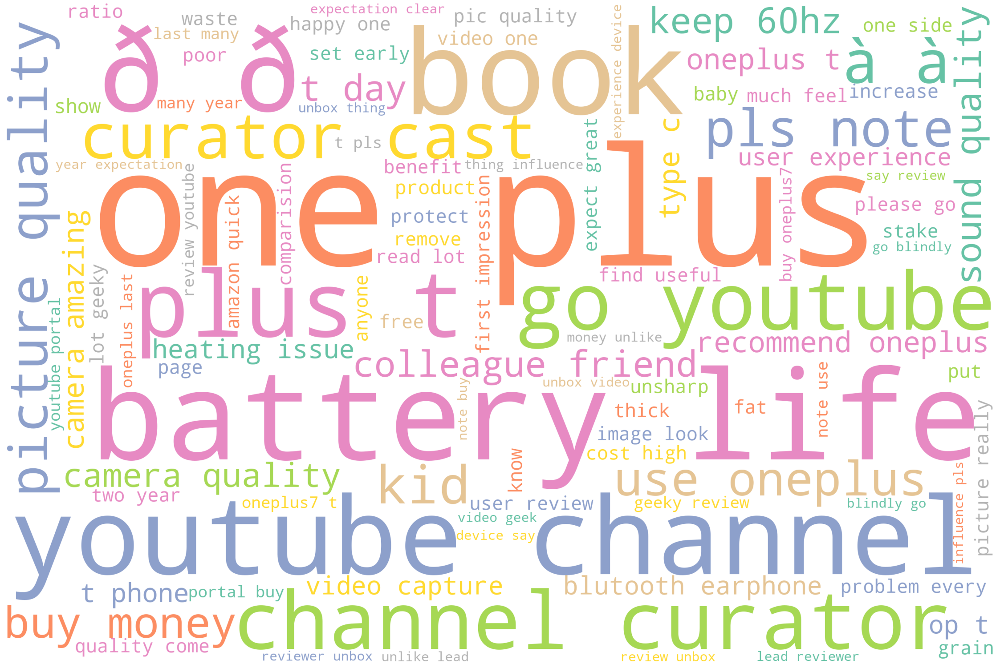

In [27]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

# Generate word cloud

STOPWORDS.add('Pron')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=100,
                   colormap='Set2',stopwords=STOPWORDS).generate(clean_reviews)
plot_cloud(wordcloud)

In [28]:
nlp=spacy.load('en_core_web_sm')

one_block=clean_reviews
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [30]:
for token in doc_block[100:200]:
    print(token,token.pos_)

love VERB
go VERB
book NOUN
surely ADV
aid NOUN
learn VERB
process3 PROPN
book NOUN
robust NOUN
withstand VERB
rough ADJ
handling NOUN
lil NOUN
champs4 NOUN
just ADV
size NOUN
book NOUN
may AUX
disapppint VERB
but CCONJ
overall ADJ
value NOUN
money NOUN
buy VERB
15 NUM
year NOUN
old ADJ
boy NOUN
he PRON
love VERB
book NOUN
we PRON
read VERB
everyday ADV
do AUX
not PART
get VERB
bored ADJ
look NOUN
book NOUN
especially ADV
transport NOUN
book NOUN
he PRON
s AUX
already ADV
learn VERB
recognize VERB
many ADJ
new ADJ
thing NOUN
this DET
healthy ADJ
distraction NOUN
cartoonsmobiletvpros PROPN
board PROPN
book NOUN
tear NOUN
bend VERB
easily ADV
round ADJ
edge NOUN
hurt NOUN
child NOUN
colourful ADJ
clear ADJ
image NOUN
every DET
page NOUN
10 NUM
topic NOUN
lot NOUN
learn VERB
pocket NOUN
size NOUN
easy ADV
carry VERB
aroundlovely ADV
set VERB
book NOUN
keep NOUN
child NOUN
engage NOUN
I PRON
ve AUX
order AUX
second ADV
set VERB
well INTJ
buy NOUN
book NOUN
day NOUN
agowhen ADV
receive VERB

In [31]:
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['engage', 'set', 'buy', 'book', 'day', 'receive', 'see', 'edgesglossy', 'finishnaturalizationcolorsizecombination', 'book', 'child', 'buy', 'child', 'child', 'love', 'parent', 'love', 'itit', 'phoneschildren', 'love', 'read', 'booksseller', 'partthe', 'image', 'bit', 'look', 'post', 'card', 'size', 'think', 'seller', 'change', 'image', 'show', 'amazon', 'websiteamazon', 'deliver', 'item', 'pack', 'youfor', 'make', 'customer', 'smile', 'company', 'log', 'book', 'series', 'picture', 'word', 'page', 'page', 'child', 'improve', 'series', 'page', 'wear', 'usage', 'warn', 'parent', 'prepare', 'book', 'agian', 'baby', 'ask', 'read', 'day', 'time', 'look', 'set', 'visit', 'youtube', 'channel', 'gforgratitude', 'flip', 'page', 'whole', 'seta', 'thing', 'find', 'style', 'book', 'series', 'content', 'picture', 'layout', 'style', 'get', 'set', 'pack', 'cost', 'gift', 'thought', 'buying', 'set', 'come', 'bind', 'case', 'storage', 'side', 'repair']


In [32]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq,key=lambda x: x[1],reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,phone,2526
1,camera,1920
2,quality,1561
3,oneplus,1320
4,battery,1320
5,experience,1203
6,buy,1130
7,go,1029
8,book,888
9,review,849


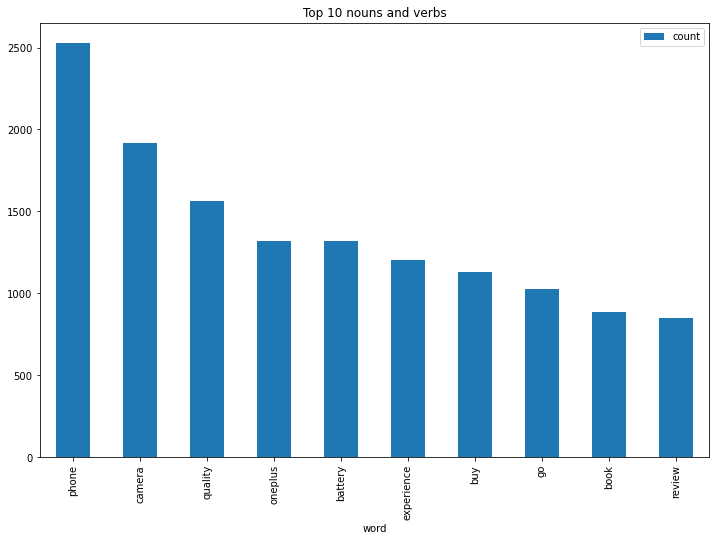

In [33]:
# Visualizing results (Barchart for top 10 nouns + verbs)
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 nouns and verbs');

In [34]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(reviews))
sentences

['\n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Writing this review after 3 months of usage.',
 'Very rugged, well build and strong board books.',
 'My 9 moth old son (back then) llhad literally abused them to greater lengths but they still are intact.',
 'Minor bends here and there which are not uncommon.',
 'My son has chewed, poured water, stood on them, Tried to press against the Binding and what not.',
 'They still are running strong.',
 'The books seem water resistant if not water proof.',
 'Coming to the content, they are clear and vibrant.',
 'My son has learnt a lot in the last six months.',
 'One tip is to read the books to your kids atleast 15 to 20 min every day.',
 'They will develop the back of glancing or reading these board books.',
 "Can't be more happy.",
 'One of the best purchases\n\n  \n \n\n\n\n\n\n\n\n\n\n  \n  \n    \n  Very effective picture book for upto 3 year babies.',
 '1.',
 'Nice Packaging & Timely delivery.2.',
 'The content & presentation is good, kids would love

In [35]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,\n\n\n\n\n\n\n\n\n\n \n \n \n Writing th...
1,"Very rugged, well build and strong board books."
2,My 9 moth old son (back then) llhad literally ...
3,Minor bends here and there which are not uncom...
4,"My son has chewed, poured water, stood on them..."
...,...
12488,But Bluetooth connection is also good/stable.
12489,No earphone jack\n\n \n \n\n\n\n\n\n\n\n\n\n ...
12490,There are two video now one review of 7T and a...
12491,OP 7T is the best of OP 7 and OP 7 pro at a go...


In [37]:
affin=pd.read_csv('C:\\dataset_excelR\\Afinn.csv',sep=',',encoding='Latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [38]:
affinity_scores=affin.set_index('word')['value'].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [39]:
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_scores

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [40]:
calculate_sentiment(text='good service')

3

In [41]:
sent_df['sentiment_value']=sent_df['sentence'].apply(calculate_sentiment)
sent_df['sentiment_value']

0         0
1         2
2         2
3         0
4         0
         ..
12488     5
12489    -1
12490     0
12491    27
12492     8
Name: sentiment_value, Length: 12493, dtype: int64

In [42]:
sent_df['word_count']=sent_df['sentence'].str.split().apply(len)
sent_df['word_count']

0          8
1          8
2         19
3          9
4         18
        ... 
12488      6
12489     19
12490     22
12491    309
12492     44
Name: word_count, Length: 12493, dtype: int64

In [43]:
sent_df.sort_values(by='sentiment_value')

,sentence,sentiment_value,word_count
651,The number book has a problem.The pages are mi...,-8,51
384,No worry of these getting torn or damage if yo...,-7,19
62,This are pocket books.Wrong way to sell item b...,-6,35
501,The finish overall is poor\n\n \n \n\n\n\n\n\...,-6,42
605,He can roughly use it without a worry of damage.,-6,10
...,...,...,...
5096,OP 7T is the best of OP 7 and OP 7 pro at a go...,27,309
3884,OP 7T is the best of OP 7 and OP 7 pro at a go...,27,309
1619,This is awesome books for kids... pictures are...,28,76
7658,Detailed review --Design - 4/5+Reduced notch+P...,28,150


In [44]:
sent_df['sentiment_value'].describe()

count    12493.000000
mean         1.452173
std          3.828628
min         -8.000000
25%          0.000000
50%          0.000000
75%          2.000000
max         28.000000
Name: sentiment_value, dtype: float64

In [45]:
# negative sentiment score of the whole review
sent_df[sent_df['sentiment_value']<=0]

,sentence,sentiment_value,word_count
0,\n\n\n\n\n\n\n\n\n\n \n \n \n Writing th...,0,8
3,Minor bends here and there which are not uncom...,0,9
4,"My son has chewed, poured water, stood on them...",0,18
6,The books seem water resistant if not water pr...,0,9
8,My son has learnt a lot in the last six months.,0,11
...,...,...,...
12483,CAMERA QUALITY IS AVERAGE.,0,4
12484,NO INCREASE IN PICTURE QUALITY.,-1,5
12485,3 CAMERAS ARE ONLY FOR NAME SAKE.I WAS VERY HA...,0,22
12489,No earphone jack\n\n \n \n\n\n\n\n\n\n\n\n\n ...,-1,19


In [46]:
sent_df[sent_df['sentiment_value']>0]

,sentence,sentiment_value,word_count
1,"Very rugged, well build and strong board books.",2,8
2,My 9 moth old son (back then) llhad literally ...,2,19
5,They still are running strong.,2,5
7,"Coming to the content, they are clear and vibr...",4,9
11,Can't be more happy.,3,4
...,...,...,...
12486,PLEASE DONT WASTE YOUR MONEY.,1,5
12487,A One plus user.Oneplus One -> Oneplus 3T -> O...,5,56
12488,But Bluetooth connection is also good/stable.,5,6
12491,OP 7T is the best of OP 7 and OP 7 pro at a go...,27,309


In [47]:
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,sentiment_value,word_count,index
0,\n\n\n\n\n\n\n\n\n\n \n \n \n Writing th...,0,8,0
1,"Very rugged, well build and strong board books.",2,8,1
2,My 9 moth old son (back then) llhad literally ...,2,19,2
3,Minor bends here and there which are not uncom...,0,9,3
4,"My son has chewed, poured water, stood on them...",0,18,4
...,...,...,...,...
12488,But Bluetooth connection is also good/stable.,5,6,12488
12489,No earphone jack\n\n \n \n\n\n\n\n\n\n\n\n\n ...,-1,19,12489
12490,There are two video now one review of 7T and a...,0,22,12490
12491,OP 7T is the best of OP 7 and OP 7 pro at a go...,27,309,12491


C:\Users\Shabarish\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='sentiment_value', ylabel='Density'>

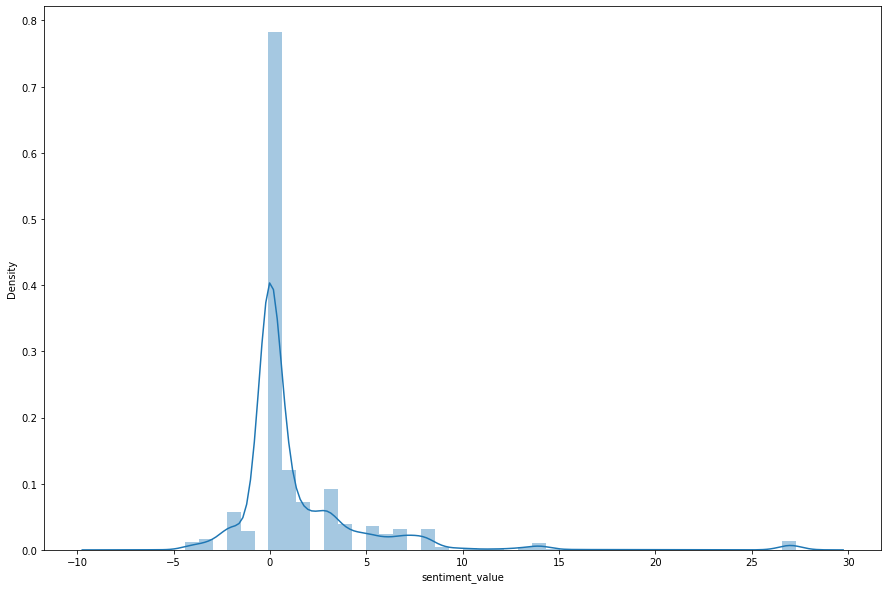

In [48]:
import seaborn as sns
plt.figure(figsize=(15,10))
sns.distplot(sent_df['sentiment_value'])

<AxesSubplot:xlabel='index', ylabel='sentiment_value'>

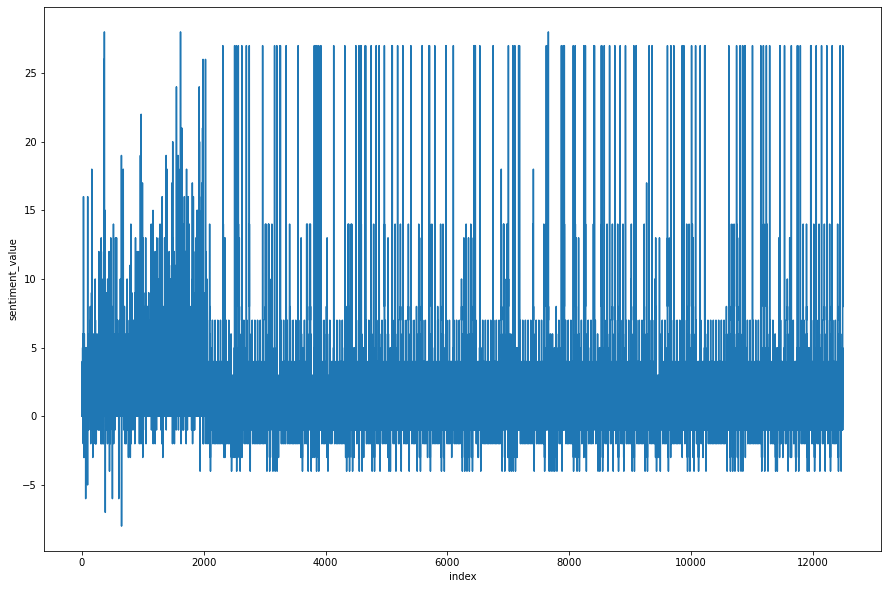

In [49]:
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_value',x='index',data=sent_df)